In [1]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("../")
#print(ROOT_DIR)

import warnings
warnings.filterwarnings("ignore")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "Mask_RCNN/samples/coco/")) # To find local version
import coco

%matplotlib inline

Using TensorFlow backend.


In [2]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join('', "C:\\Users\\vivek\\.conda\\envs\\MaskRCNN\\Mask_RCNN\\samples\\coco\\mask_rcnn_garbage_0030.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "Mask_RCNN/Dataset/val")

In [3]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [4]:
model = modellib.MaskRCNN(mode="inference", model_dir='mask_rcnn_coco.hy', config=config)

# Load weights trained on MS-COCO
model.load_weights('C:\\Users\\vivek\\.conda\\envs\\MaskRCNN\\Mask_RCNN\\samples\\coco\\mask_rcnn_garbage_0008.h5', by_name=True)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.cast instead.


In [5]:
class_names = ['BG', 'Plastic', 'Non-Plastic']

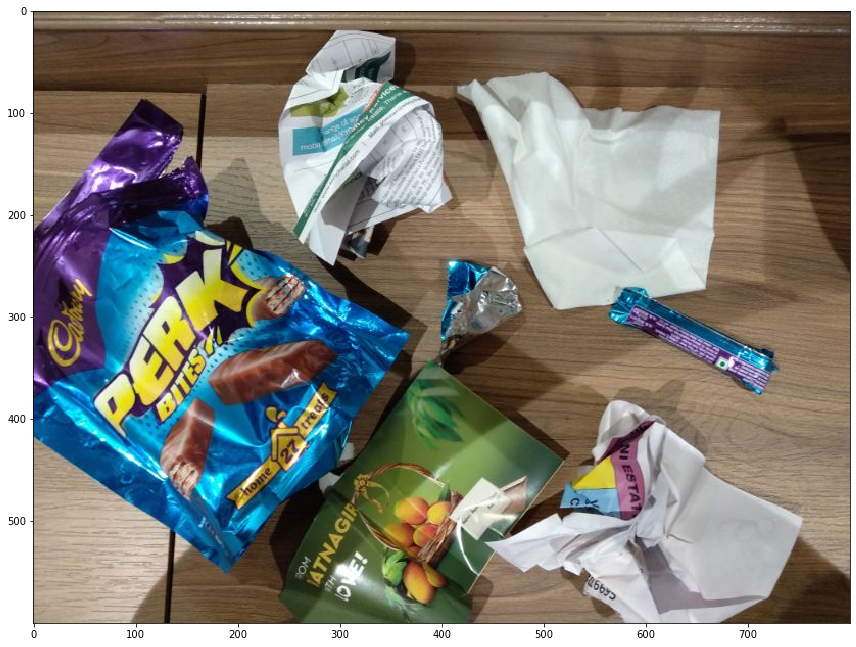

In [7]:
image = skimage.io.imread('Dataset/val/IMG_20200223_174020.jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)

Processing 1 images
image                    shape: (600, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


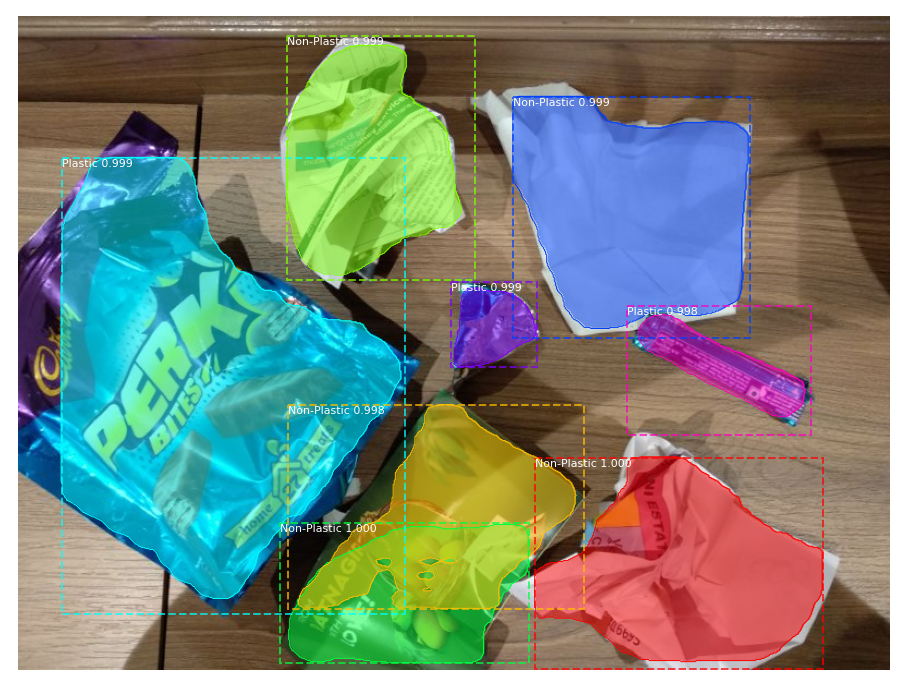

In [8]:
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])


In [10]:
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

Total objects found 8
Non-Plastic
Non-Plastic
Plastic
Non-Plastic
Plastic
Non-Plastic
Plastic
Non-Plastic
Platic: 3
Non-Platic: 5


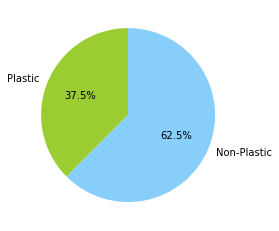

In [11]:
import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (600, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


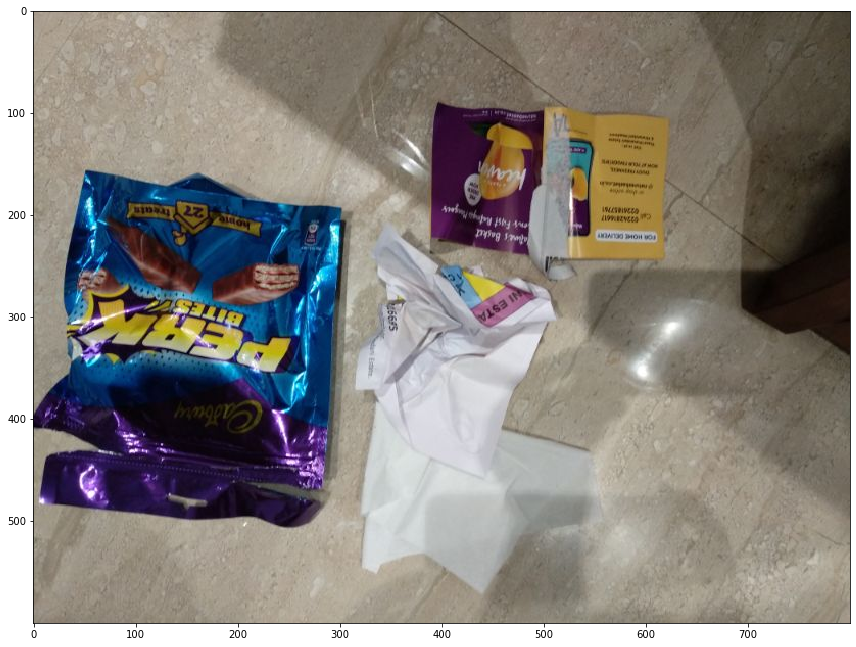

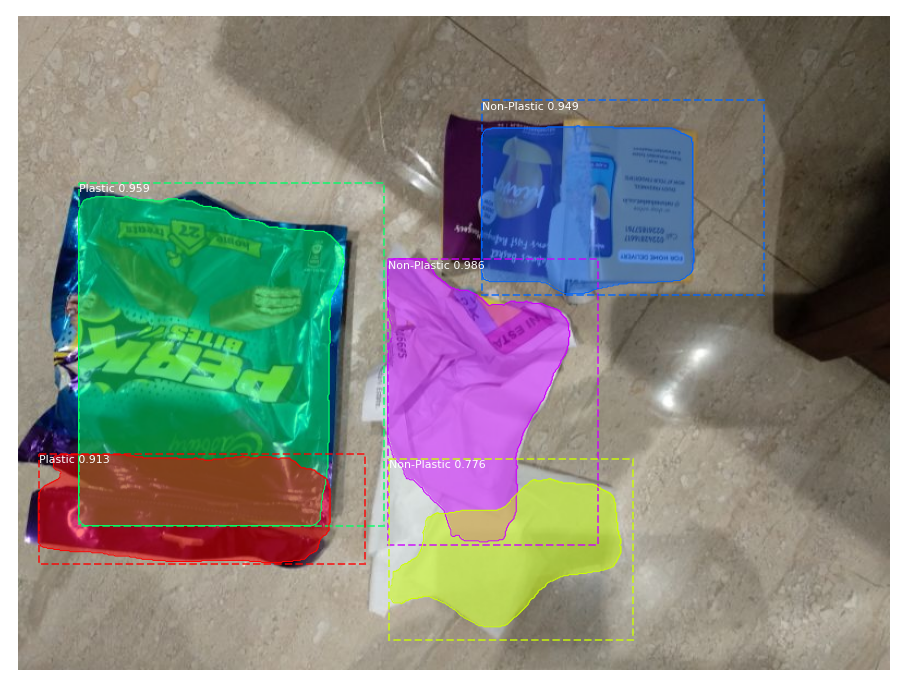

Total objects found 5
Non-Plastic
Plastic
Non-Plastic
Plastic
Non-Plastic
Platic: 2
Non-Platic: 3


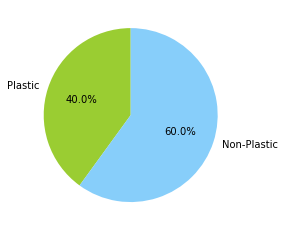

In [16]:
image = skimage.io.imread('Dataset/val/IMG_20200223_174723.jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (600, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


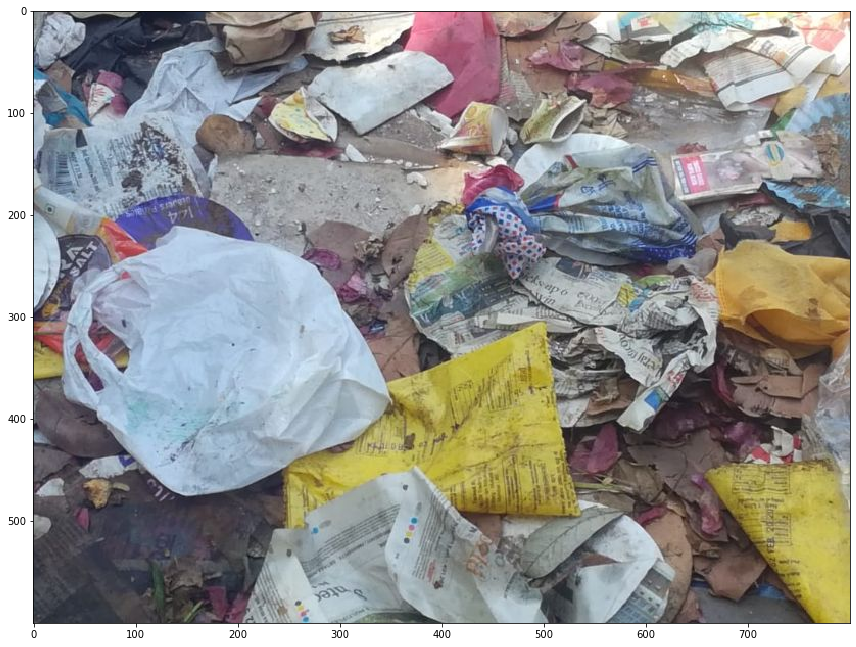

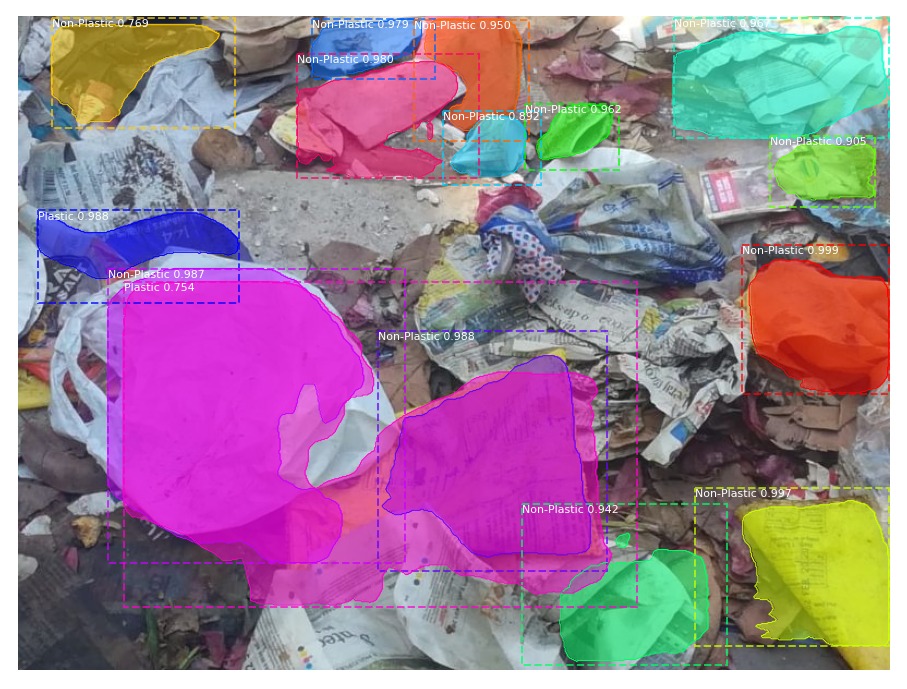

Total objects found 15
Non-Plastic
Non-Plastic
Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Plastic
Platic: 2
Non-Platic: 13


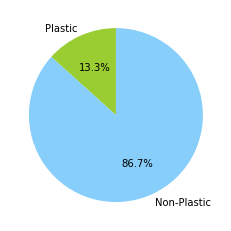

In [15]:
image = skimage.io.imread('Dataset/val/WhatsApp Image 2020-03-13 at 5.51.30 PM (1).jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (600, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


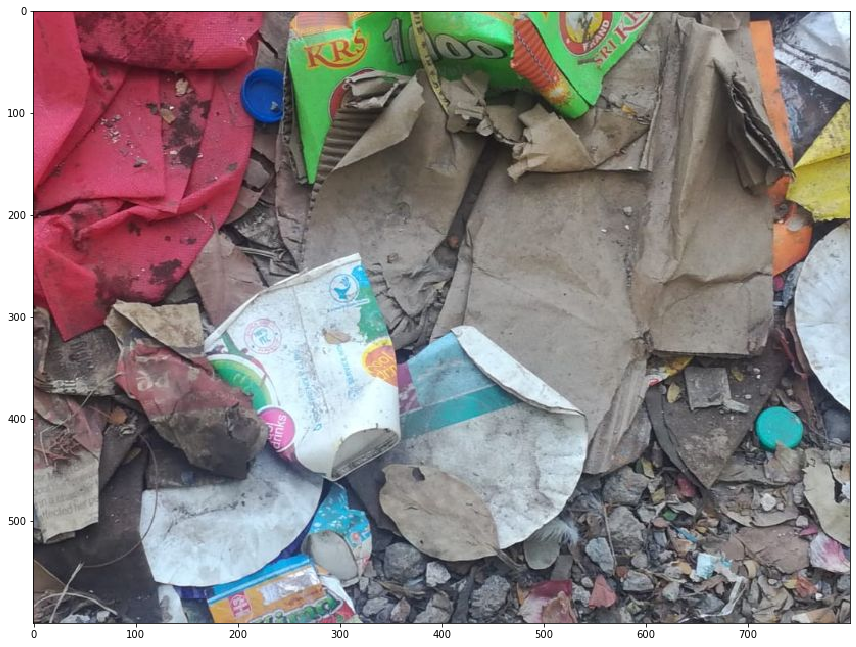

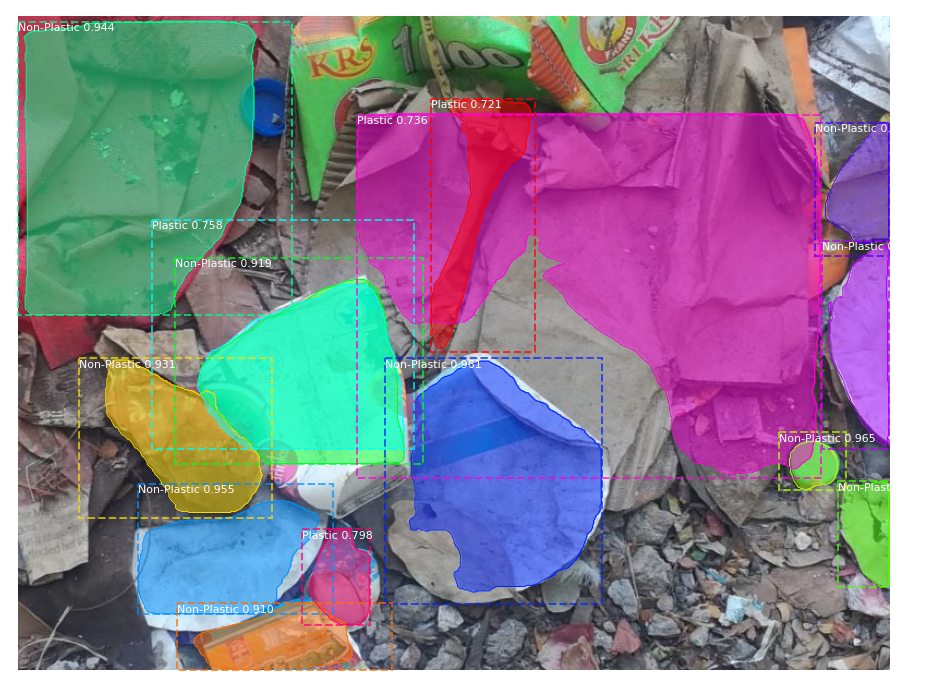

Total objects found 14
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Non-Plastic
Plastic
Non-Plastic
Plastic
Plastic
Plastic
Platic: 4
Non-Platic: 10


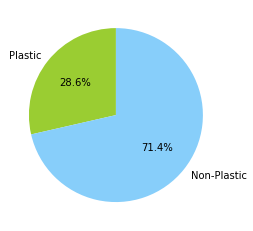

In [20]:
image = skimage.io.imread('Dataset/val/WhatsApp Image 2020-03-13 at 5.51.25 PM (1).jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (600, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


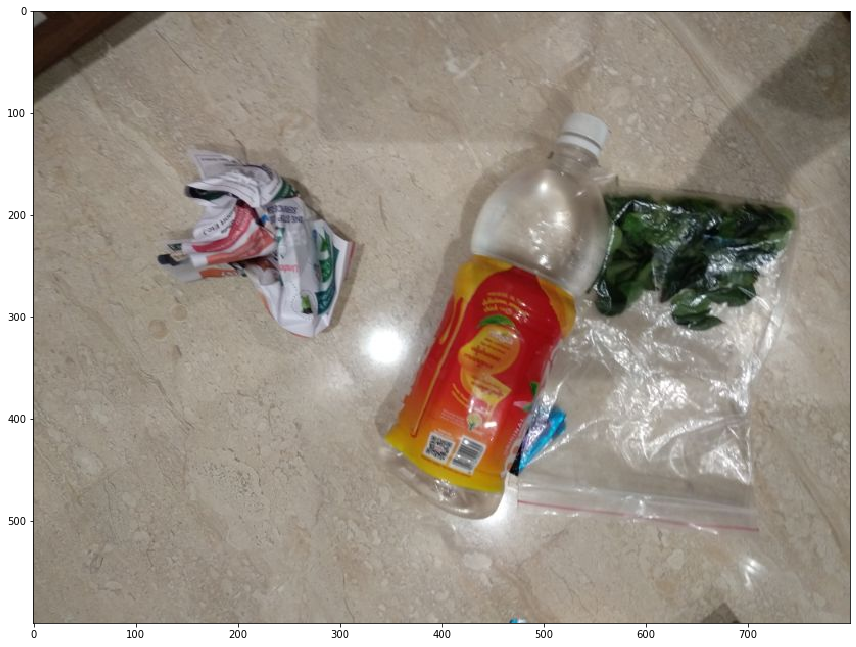

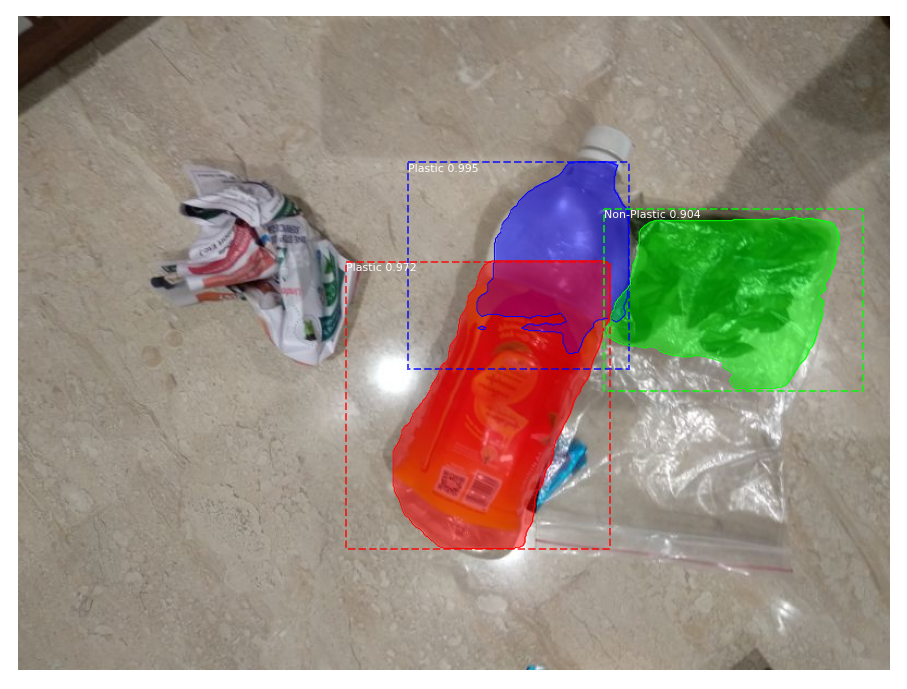

Total objects found 3
Plastic
Plastic
Non-Plastic
Platic: 2
Non-Platic: 1


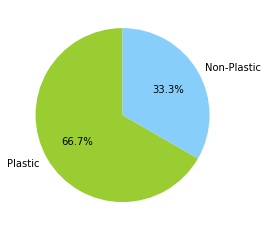

In [22]:
image = skimage.io.imread('Dataset/val/IMG_20200223_174638.jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (1040, 780, 3)        min:   46.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1040.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


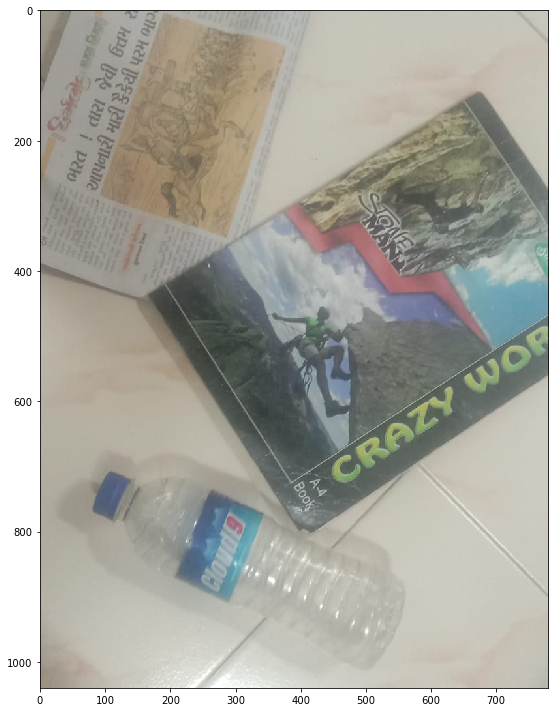

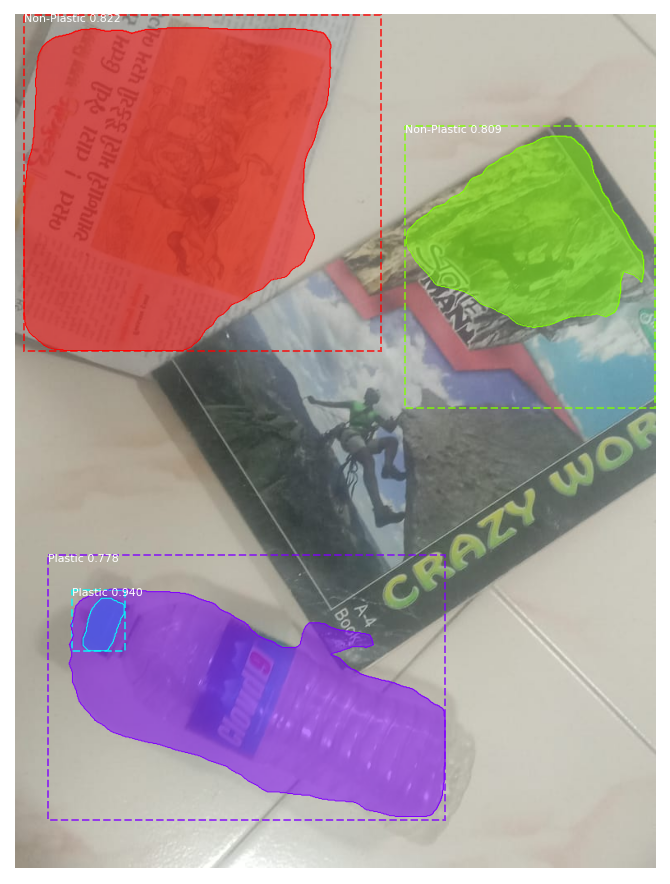

Total objects found 4
Plastic
Non-Plastic
Non-Plastic
Plastic
Platic: 2
Non-Platic: 2


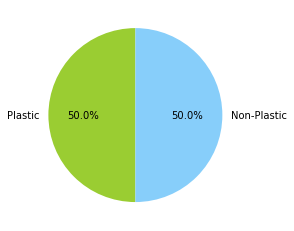

In [23]:
image = skimage.io.imread('Dataset/val/wht.jpeg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

Processing 1 images
image                    shape: (800, 800, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


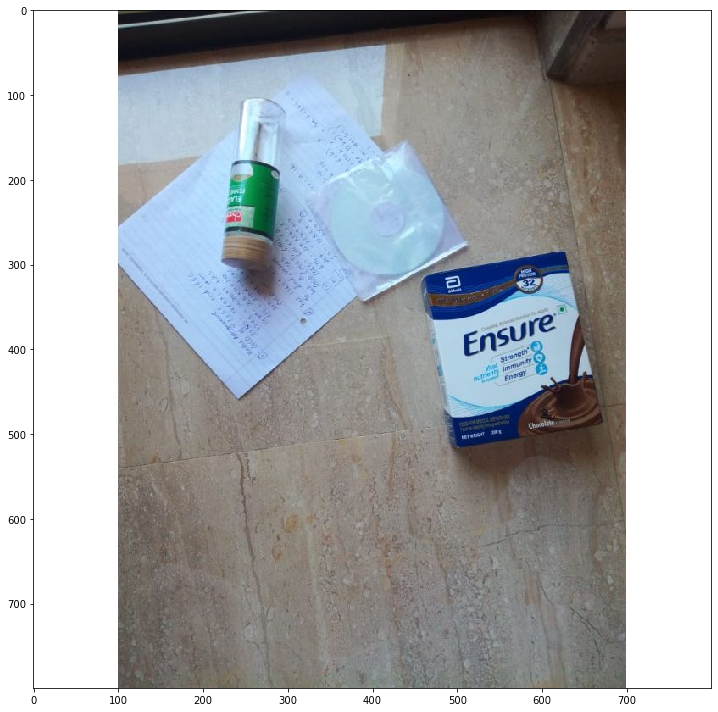

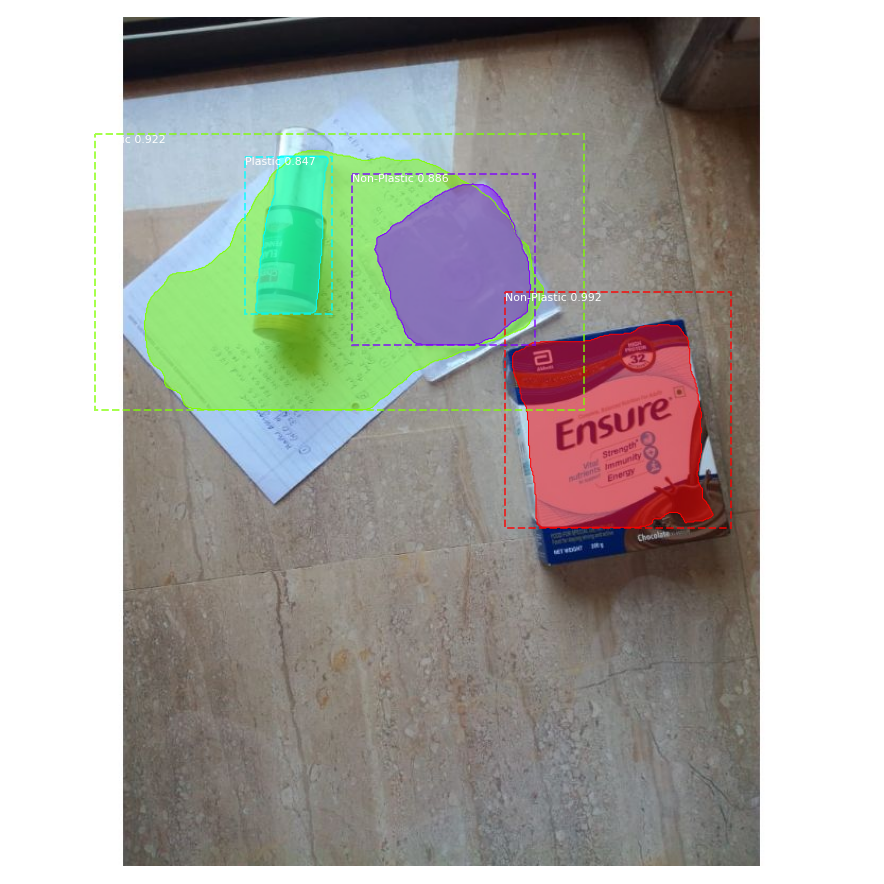

Total objects found 4
Non-Plastic
Plastic
Non-Plastic
Plastic
Platic: 2
Non-Platic: 2


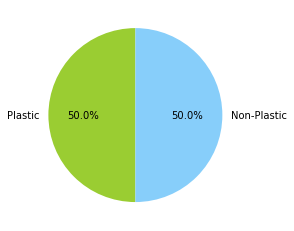

In [24]:
image = skimage.io.imread('Dataset/all_test/WhatsApp Image 2020-03-19 at 12.30.59 PM.jpg')

# original image
plt.figure(figsize=(12,10))
skimage.io.imshow(image)
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
list1=[]
classes=r['class_ids']
print("Total objects found",len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])
    list1.append(class_names[classes[i]])

count_p=list1.count('Plastic')
count_n=list1.count('Non-Plastic')
print("Platic:",count_p)
print("Non-Platic:",count_n)

import matplotlib.pyplot as plt

labels = ['Plastic', 'Non-Plastic']
sizes = [count_p, count_n]
colors = ['yellowgreen', 'lightskyblue']
activities = ['Plastic', 'Non-Plastic']
plt.pie(sizes, labels=activities, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()